# Projeto Airbnb Rio - Ferramenta de Previsão de Preço de Imóvel para pessoas comuns

Contexto
No Airbnb, qualquer pessoa que tenha um quarto ou um imóvel de qualquer tipo (apartamento, casa, chalé, pousada, etc.) pode ofertar o seu imóvel para ser alugado por diária.

Você cria o seu perfil de host (pessoa que disponibiliza um imóvel para aluguel por diária) e cria o anúncio do seu imóvel.

Nesse anúncio, o host deve descrever as características do imóvel da forma mais completa possível, de forma a ajudar os locadores/viajantes a escolherem o melhor imóvel para eles (e de forma a tornar o seu anúncio mais atrativo)

Existem dezenas de personalizações possíveis no seu anúncio, desde quantidade mínima de diária, preço, quantidade de quartos, até regras de cancelamento, taxa extra para hóspedes extras, exigência de verificação de identidade do locador, etc.

Nosso cbjetivo
Construir um modelo de previsão de preço que permita uma pessoa comum que possui um imóvel possa saber quanto deve cobrar pela diária do  no Rio de Janeiroseu imóvel.

Ou ainda, para o locador comum, dado o imóvel que ele está buscando, ajudar a saber se aquele imóvel está com preço atrativo (abaixo da média para imóveis com as mesmas características) ou não.

O que temos disponível, inspirações e créditos
As bases de dados foram retiradas.-ro atualizadas).

As bases de dados são os preços dos imóveis obtidos e suas respectivas características em cada mês.
Os preços são dados em reais (R$)
Temos bases de abril de 2018 a maio de 2020, com exceção de junho de 2018 que não possui base de dados
Expectativas Iniciais
Acredito que a sazonalidade pode ser um fator importante, visto que meses como dezembro costumam ser bem caros no RJ
A localização do imóvel deve fazer muita diferença no preço, já que no Rio de Janeiro a localização pode mudar completamente as características do lugar (segurança, beleza natural, pontos turísticos)
Adicionais/Comodidades podem ter um impacto significativo, visto que temos muitos prédios e casas antigos no Rio de Janeiro
Vamos descobrir o quanto esses fatores impactam e se temos outros fatores não tão intuitivos que são extremamente importantes.

In [31]:
import pandas as pd
import numpy as np
import pathlib
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split

In [32]:
# Define o caminho da pasta onde os arquivos estão localizados
caminho_bases = pathlib.Path('datasetAirBnBRio')
lista_dataframes = []

# Itera sobre todos os arquivos .csv na pasta e adiciona cada dataframe à lista
for arquivo in caminho_bases.glob("*.csv"):
    df = pd.read_csv(arquivo, low_memory=False)  # Define low_memory=False para evitar DtypeWarning
    lista_dataframes.append(df)

# Consolida todos os dataframes em um só
base_airbnb = pd.concat(lista_dataframes, ignore_index=True)

# Exibe o dataframe consolidado
display(base_airbnb)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
902206,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
902207,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
902208,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


## Criando mais duas colunas de mês e ano, utilizando a coluna 'last_scraped' como referência, para facilitar a manipulação dos dados

In [33]:
# Converte a coluna 'last_scraped' para o tipo datetime, caso ainda não esteja no formato de data
base_airbnb['last_scraped'] = pd.to_datetime(base_airbnb['last_scraped'])

# Adiciona a coluna 'mes' extraindo o mês da coluna 'last_scraped'
base_airbnb['mes'] = base_airbnb['last_scraped'].dt.month

# Adiciona a coluna 'ano' extraindo o ano da coluna 'last_scraped'
base_airbnb['ano'] = base_airbnb['last_scraped'].dt.year

## Tratando o dataframe para a manipulação dos dados

In [34]:
# extraindo para arquivos csv e xlsx para uma melhor vissualização
#base_airbnb.head(1000).to_csv('primeiros_registros.csv', sep = ';')
#base_airbnb.head(1000).to_excel('primeiros_registros.xlsx', index=False)

In [35]:
colunas = ['host_response_time','host_response_rate','host_is_superhost','host_listings_count','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','amenities','price','security_deposit','cleaning_fee','guests_included','extra_people','minimum_nights','maximum_nights','number_of_reviews','review_scores_rating',	'review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy','mes','ano']

base_airbnb = base_airbnb.loc[:,colunas]
display(base_airbnb)

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,latitude,longitude,property_type,room_type,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,mes,ano
0,NaN,NaN,f,1.0,-22.946854,-43.182737,Apartment,Entire home/apt,4,1.0,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,4,2018
1,within an hour,100%,t,2.0,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,4,2018
2,within an hour,100%,f,1.0,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,4,2018
3,within an hour,100%,f,3.0,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,4,2018
4,within an hour,100%,t,1.0,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,4,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,within an hour,93%,f,0.0,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,9,2019
902206,NaN,NaN,f,0.0,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,9,2019
902207,within a few hours,74%,f,32.0,-22.962080,-43.175520,Apartment,Entire home/apt,5,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,9,2019
902208,NaN,NaN,f,0.0,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,9,2019


## Retirando os valores nulos

In [36]:
# exclui as colunas que possuem mais de 300.000 linhas com valores nulos
for colunas in base_airbnb:
    if base_airbnb[colunas].isnull().sum() > 300000:
        base_airbnb = base_airbnb.drop(colunas, axis=1)
    
# Confirma os tipos de dados após a conversão
print(base_airbnb.isnull().sum())

host_is_superhost            460
host_listings_count          460
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                   1724
bedrooms                     850
beds                        2502
bed_type                       0
amenities                      0
price                          0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
instant_bookable               0
is_business_travel_ready       0
cancellation_policy            0
mes                            0
ano                            0
dtype: int64


In [37]:
# excluindo todas as linhas que possuem valores nulos
#base_airbnb = base_airbnb.dropna()
print(base_airbnb.shape)
print(base_airbnb.isnull().sum())

(902210, 23)
host_is_superhost            460
host_listings_count          460
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                   1724
bedrooms                     850
beds                        2502
bed_type                       0
amenities                      0
price                          0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
instant_bookable               0
is_business_travel_ready       0
cancellation_policy            0
mes                            0
ano                            0
dtype: int64


In [38]:
print(base_airbnb.dtypes)
print('-'*60)
print(base_airbnb.iloc[0])

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
mes                           int32
ano                           int32
dtype: object
------------------------------------------------------------
host_is_superhost                                                           f
host_listings_count

- Alterando os valores abaixo para tipo = float e retirando o '$' e a vírgula

In [39]:
#price
base_airbnb['price'] = base_airbnb['price'].str.replace('$', '')
base_airbnb['price'] = base_airbnb['price'].str.replace(',', '')
base_airbnb['price'] = base_airbnb['price'].astype(np.float32, copy=False)

#extra_people
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$', '')
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace(',', '')
base_airbnb['extra_people'] = base_airbnb['extra_people'].astype(np.float32, copy=False)

## Análise exploratória e tratamento de Outliers

- Vamos basicamente olhar feature por feature para:
    1. Ver a correlação entre as features e decidir se manteremos todas as features que temos.
    2. Excluir outliers (usaremos como regra, valores abaixo de Q1 - 1.5xAmplitude e valores acima de Q3 + 1.5x Amplitude). Amplitude = Q3 - Q1
    3. Confirmar se todas as features que temos fazem realmente sentido para o nosso modelo ou se alguma delas não vai nos ajudar e se devemos excluir
    
- Vamos começar pelas colunas de preço (resultado final que queremos) e de extra_people (também valor monetário). Esses são os valores numéricos contínuos.

- Depois vamos analisar as colunas de valores numéricos discretos (accomodates, bedrooms, guests_included, etc.)

- Por fim, vamos avaliar as colunas de texto e definir quais categorias fazem sentido mantermos ou não.

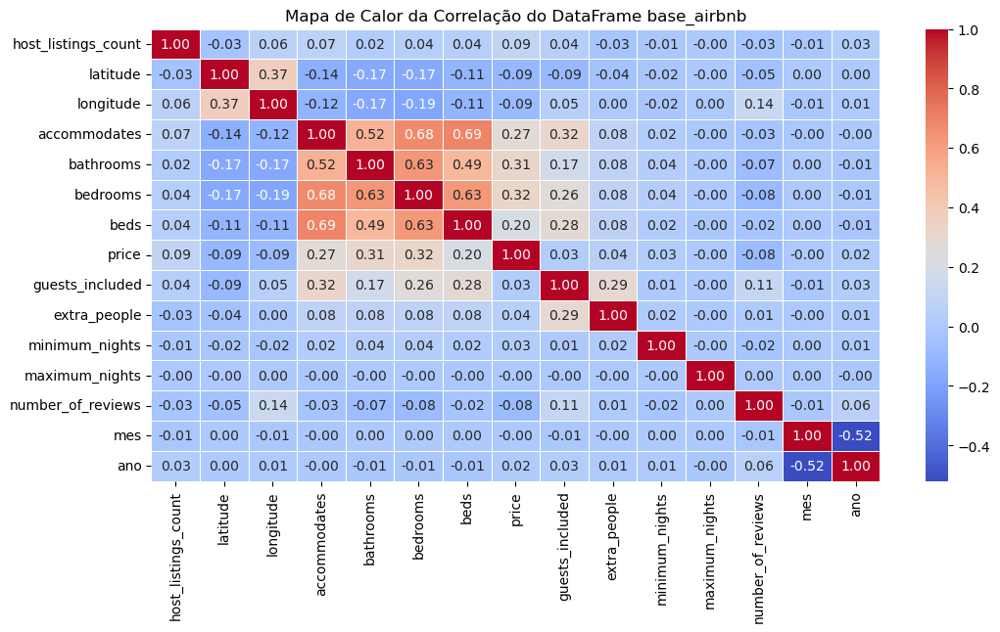

In [40]:
# Seleciona apenas as colunas numéricas
numeric_cols = base_airbnb.select_dtypes(include=['number'])

# Calcula e imprime a correlação entre as colunas numéricas
#print(numeric_cols.corr())

# Seleciona apenas as colunas numéricas para calcular a correlação
numeric_cols = base_airbnb.select_dtypes(include=['number'])
correlation_matrix = numeric_cols.corr()

# Configura o tamanho do gráfico
plt.figure(figsize=(12, 6))

# Cria o mapa de calor
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Adiciona título e exibe o gráfico
plt.title('Mapa de Calor da Correlação do DataFrame base_airbnb')
plt.show()


### Definição de Funções para Análise de Outliers

Vamos definir algumas funções para ajudar na análise de outliers das colunas

In [41]:
def limites(coluna):
    # Calcula o primeiro quartil (Q1) da coluna
    q1 = coluna.quantile(0.25)
    # Calcula o terceiro quartil (Q3) da coluna
    q3 = coluna.quantile(0.75)
    # Calcula a amplitude interquartil (IQR) como a diferença entre Q3 e Q1
    amplitude = q3 - q1
    
    return q1 - 1.5 * amplitude, q3 + 1.5 * amplitude

def excluir_outliers(df, nome_coluna):
    # Guarda o número original de linhas do DataFrame
    qtde_linhas = df.shape[0]
    # Calcula os limites inferior e superior para a coluna, usando a função limites
    lim_inf, lim_sup = limites(df[nome_coluna])
    # Filtra o DataFrame para manter apenas as linhas que estão dentro dos limites
    df = df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :]
    # Calcula a quantidade de linhas removidas subtraindo o novo número de linhas do original
    linhas_removidas = qtde_linhas - df.shape[0]

    return df, linhas_removidas


### Definindo as funções para os gráficos de análises

In [42]:
def diagrama_caixa(coluna):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 5)
    sns.boxplot(x=coluna, ax=ax1)
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax=ax2)
    
def histograma(coluna):
    plt.figure(figsize=(15, 5))
    # Cria o histograma com barras verticais e uma linha KDE
    sns.histplot(coluna, kde=True, stat="density", element="bars", color="skyblue", edgecolor="black")
    plt.title('Histograma com linha KDE')
    plt.xlabel('Valores')
    plt.ylabel('Densidade')
    plt.show()

def grafico_barra(coluna):  
    plt.figure(figsize=(15, 5))
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
    ax.set_xlim(limites(coluna))


### Como estamos construindo um modelo para imóveis comuns, acredito que os valores acima do limite superior serão apenas de apartamentos de altíssimo luxo, que não é o nosso objetivo principal. Por isso, podemos excluir esses outliers.

## price análise

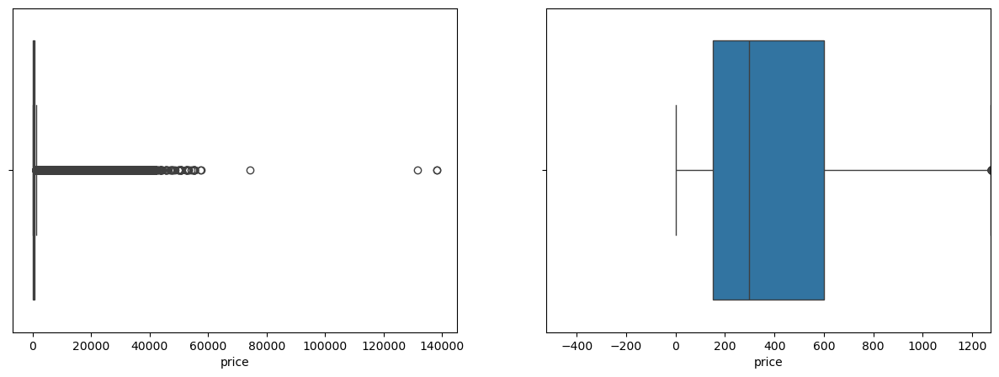

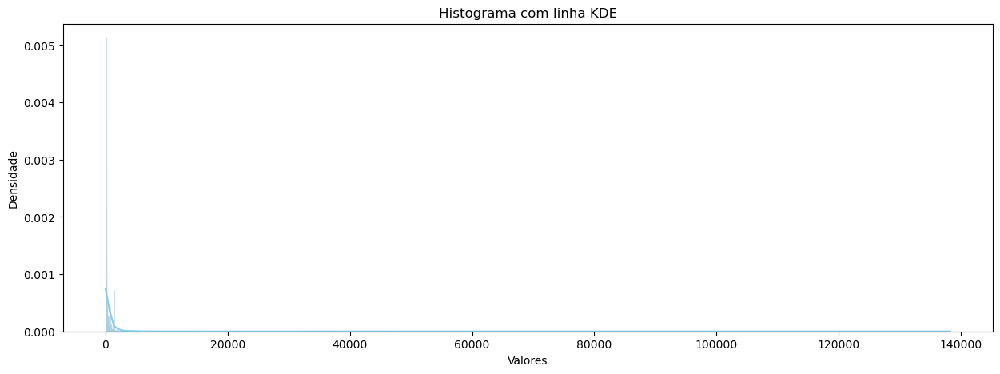

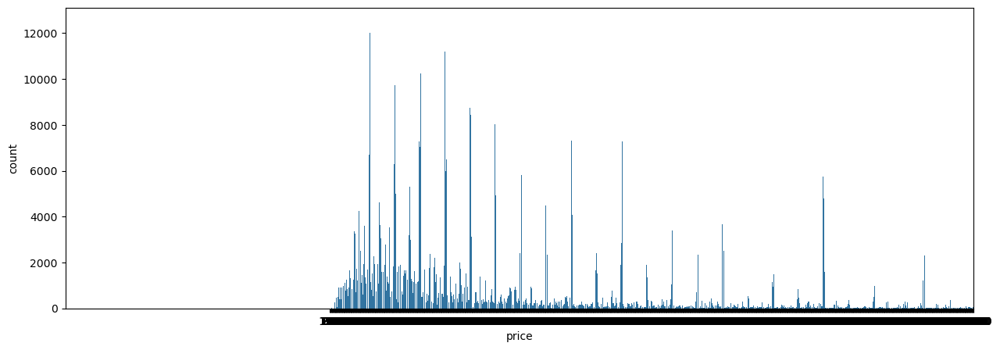

In [43]:
diagrama_caixa(base_airbnb['price'])
histograma(base_airbnb['price'])
grafico_barra(base_airbnb['price'])

In [44]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'price')
print('{} linhas removidas'.format(linhas_removidas))

87575 linhas removidas


## extra_people análise

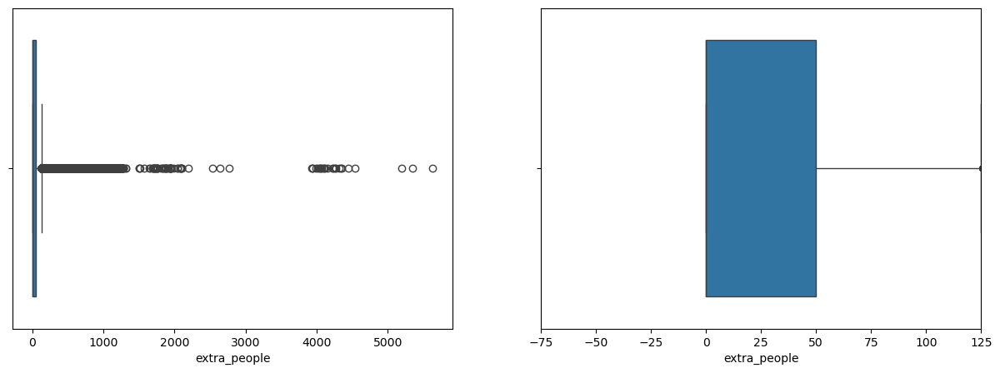

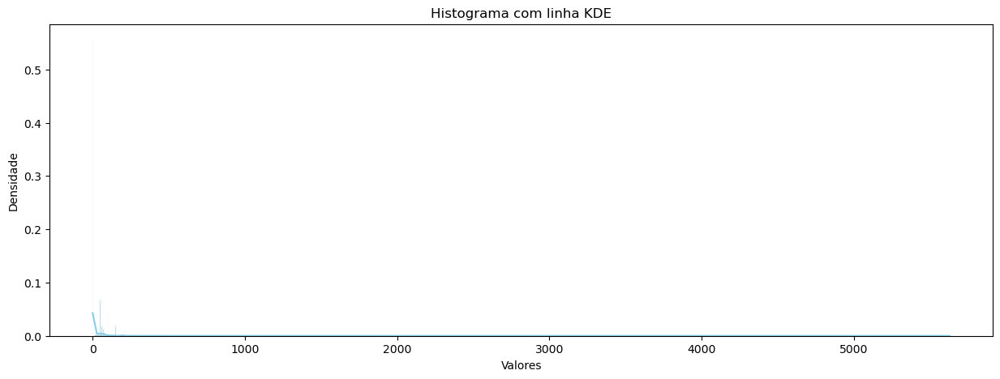

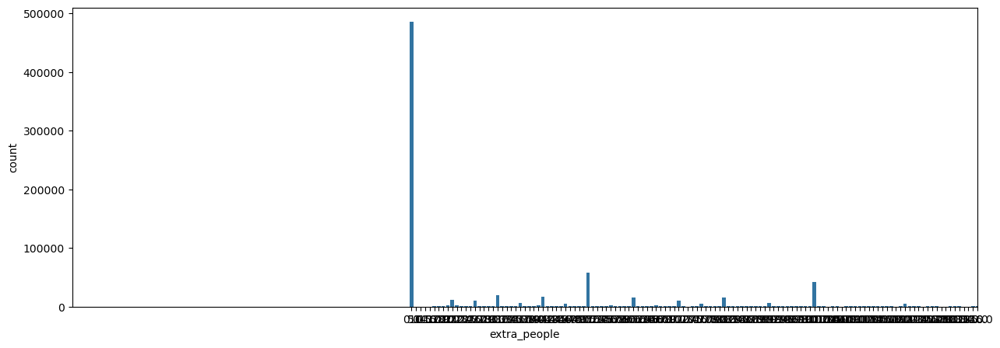

In [45]:
diagrama_caixa(base_airbnb['extra_people'])
histograma(base_airbnb['extra_people'])
grafico_barra(base_airbnb['extra_people'])

In [46]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'extra_people')
print('{} linhas removidas'.format(linhas_removidas))

59373 linhas removidas


## host_listings_count análise

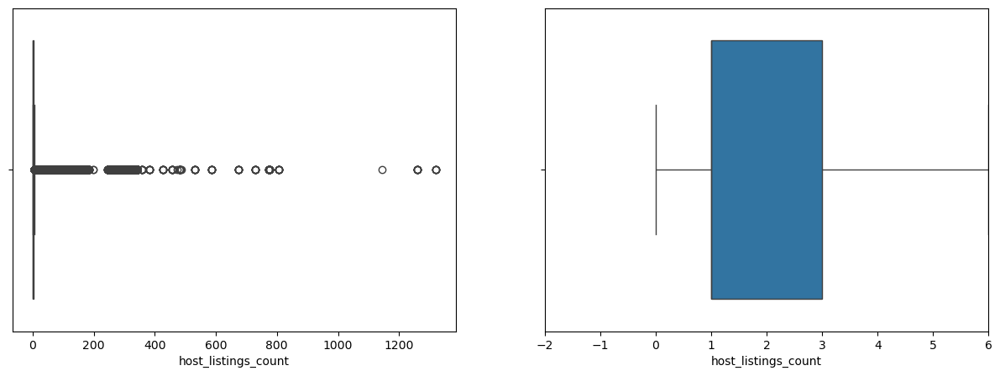

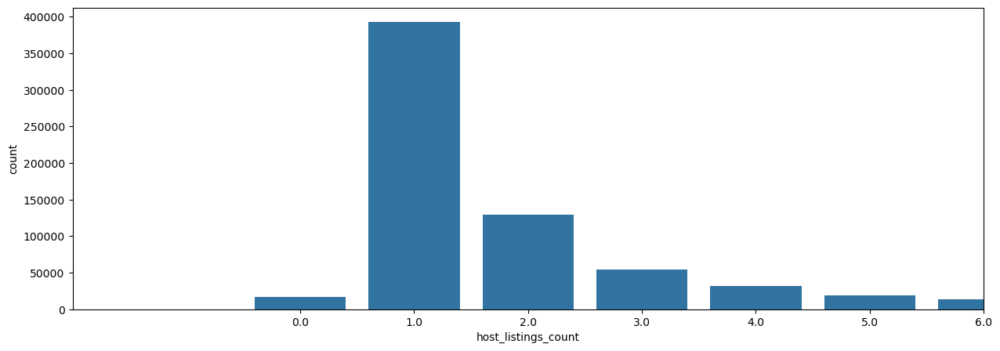

In [47]:
diagrama_caixa(base_airbnb['host_listings_count'])
grafico_barra(base_airbnb['host_listings_count'])

Dado que a maioria das pessoas não tem mais de um imível os outliers serão removidos. Provavelmente os com mais de 4 são imobiliárias e ou profissionais do airbnb.

In [48]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'host_listings_count')
print('{} linhas removidas'.format(linhas_removidas))

98749 linhas removidas


## accommodates análise

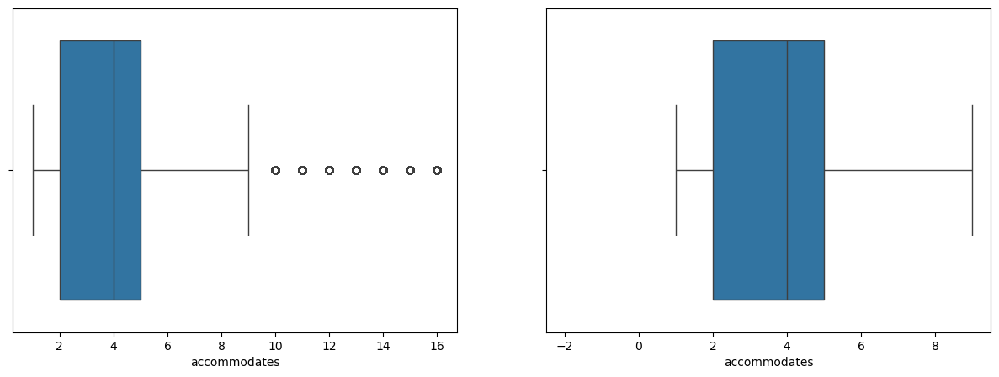

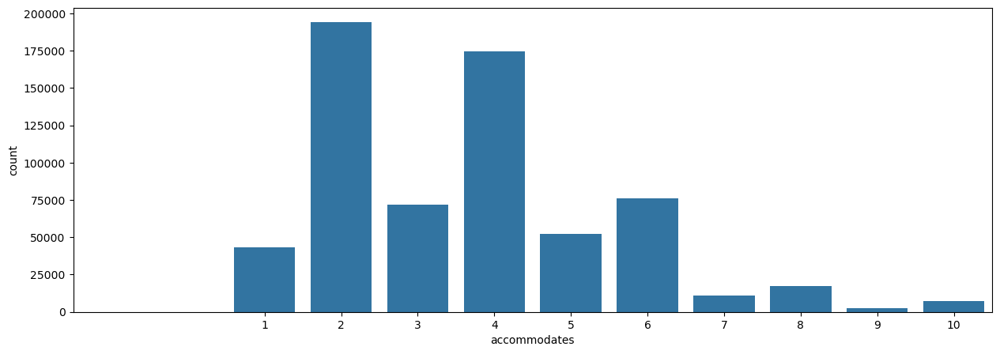

In [49]:
diagrama_caixa(base_airbnb['accommodates'])
grafico_barra(base_airbnb['accommodates'])

In [50]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'accommodates')
print('{} linhas removidas'.format(linhas_removidas))

13183 linhas removidas


## bathrooms análise

<Axes: xlabel='bathrooms', ylabel='count'>

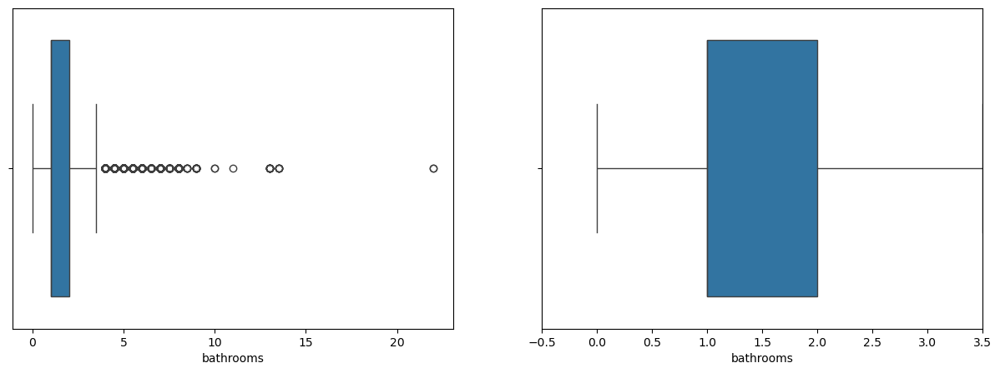

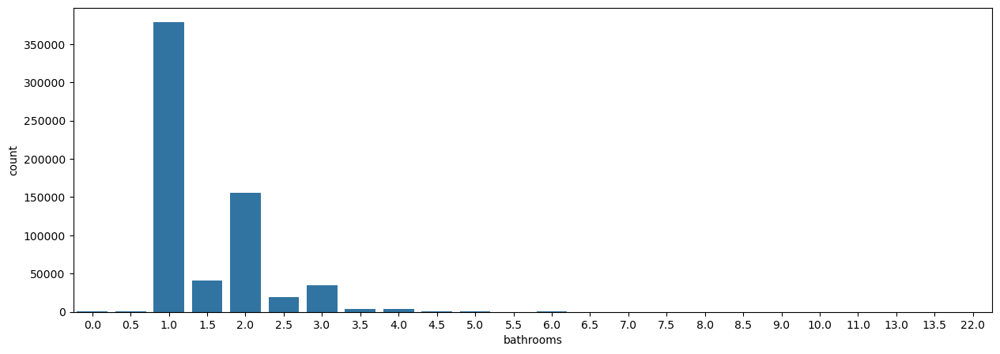

In [51]:
diagrama_caixa(base_airbnb['bathrooms'])
# nesse caso pegar a função do grafico_barra, não estava trazendo os valores corretos então decidi colocar o gráfico aqui mesmo 
#grafico_barra(base_airbnb['bathrooms'])

plt.figure(figsize=(15, 5))
sns.barplot(x=base_airbnb['bathrooms'].value_counts().index, y=base_airbnb['bathrooms'].value_counts())

In [52]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bathrooms')
print('{} linhas removidas'.format(linhas_removidas))

8131 linhas removidas


## bedrooms análise

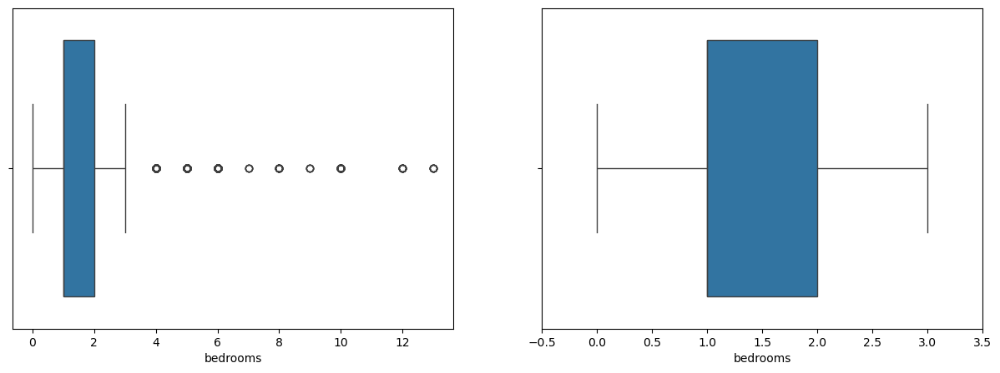

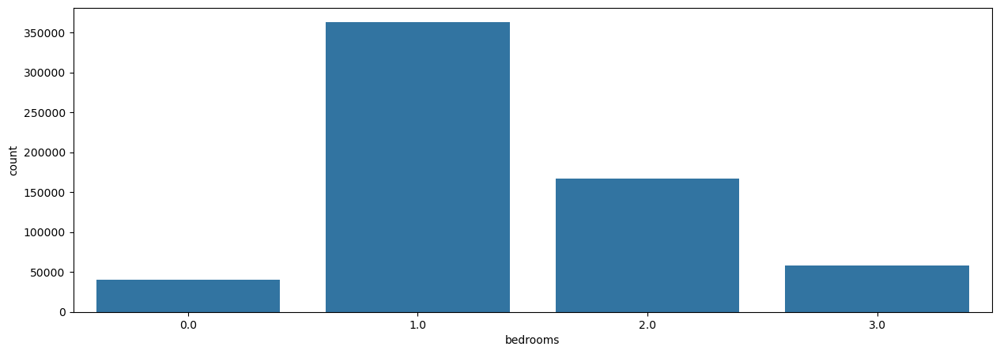

In [53]:
diagrama_caixa(base_airbnb['bedrooms'])
grafico_barra(base_airbnb['bedrooms'])

In [54]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bedrooms')
print('{} linhas removidas'.format(linhas_removidas))

6043 linhas removidas


## beds análise

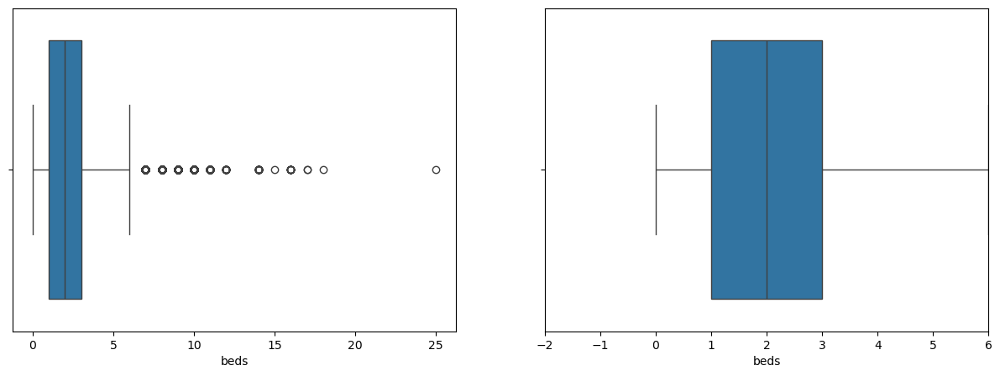

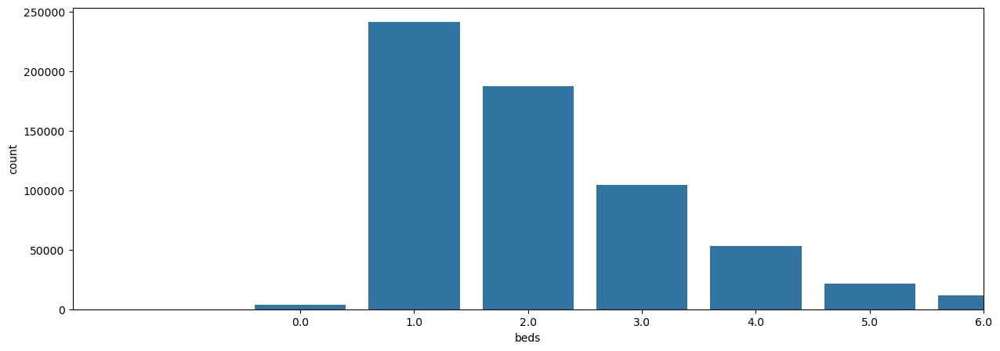

In [55]:
diagrama_caixa(base_airbnb['beds'])
grafico_barra(base_airbnb['beds'])

In [56]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'beds')
print('{} linhas removidas'.format(linhas_removidas))

6790 linhas removidas


## guests_included análise

C:\Users\Luis Roberta\AppData\Local\Temp\ipykernel_9028\1059220079.py:5: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax2.set_xlim(limites(coluna))
C:\Users\Luis Roberta\AppData\Local\Temp\ipykernel_9028\1059220079.py:20: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(limites(coluna))


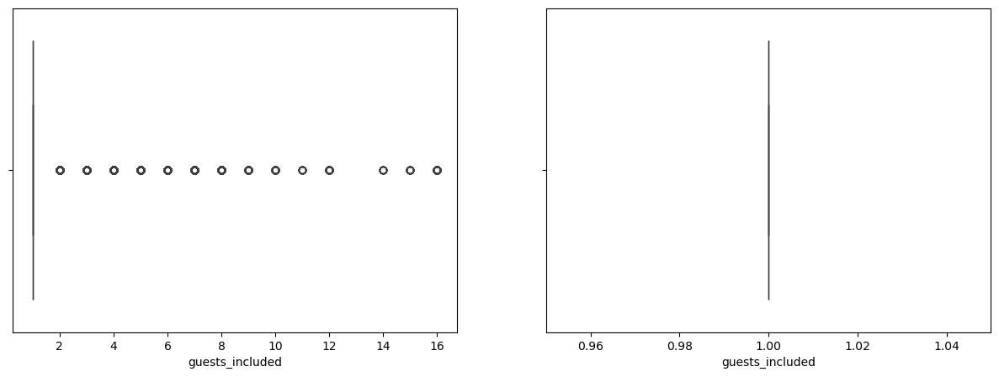

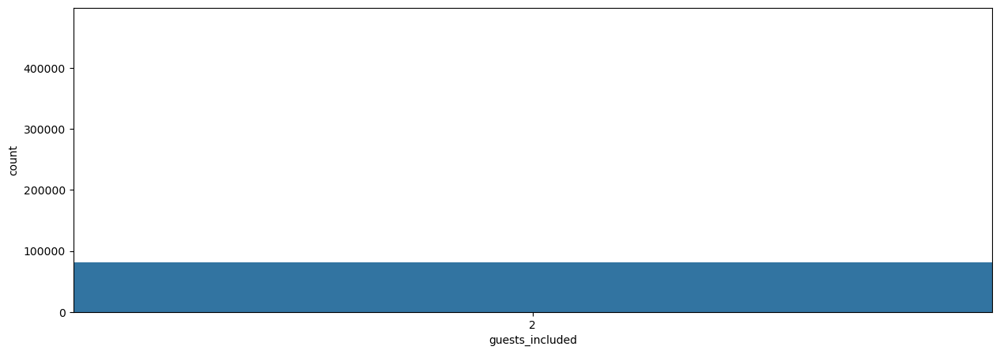

In [57]:
diagrama_caixa(base_airbnb['guests_included'])
grafico_barra(base_airbnb['guests_included'])

In [58]:
base_airbnb = base_airbnb.drop('guests_included', axis=1)
base_airbnb.shape

(622366, 22)

Vamos ecluir essa feature da análise. Parece que os uasurário do airbnb usam a opção 1 guest como default. E isso pode comprometer a nossa máquina preditiva

## minimum_nights análise

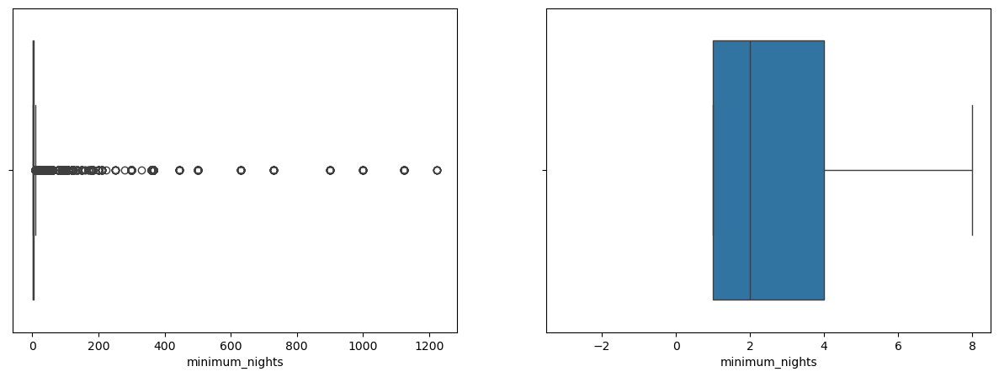

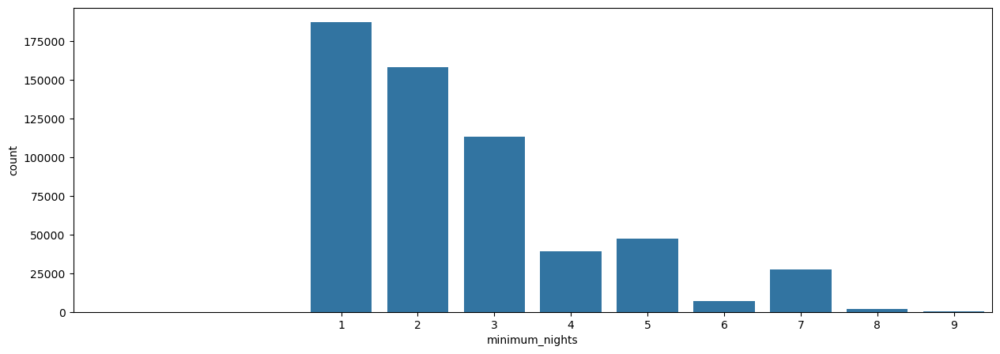

In [59]:
diagrama_caixa(base_airbnb['minimum_nights'])
grafico_barra(base_airbnb['minimum_nights'])

In [60]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'minimum_nights')
print('{} linhas removidas'.format(linhas_removidas))

40383 linhas removidas


## maximum_nights análise

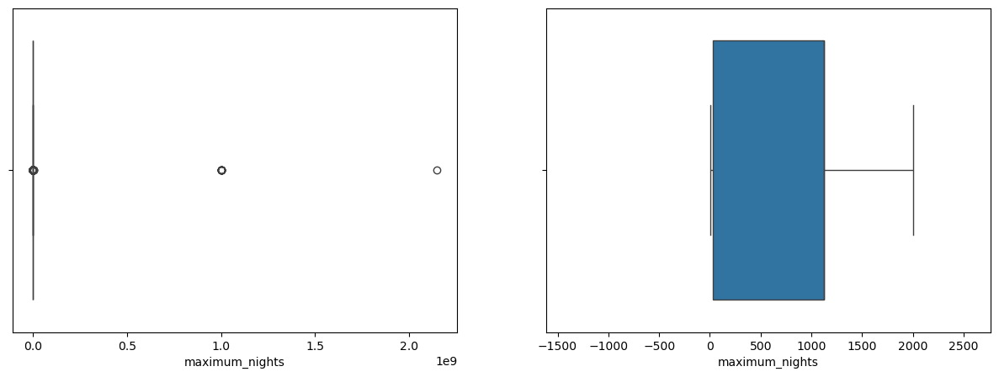

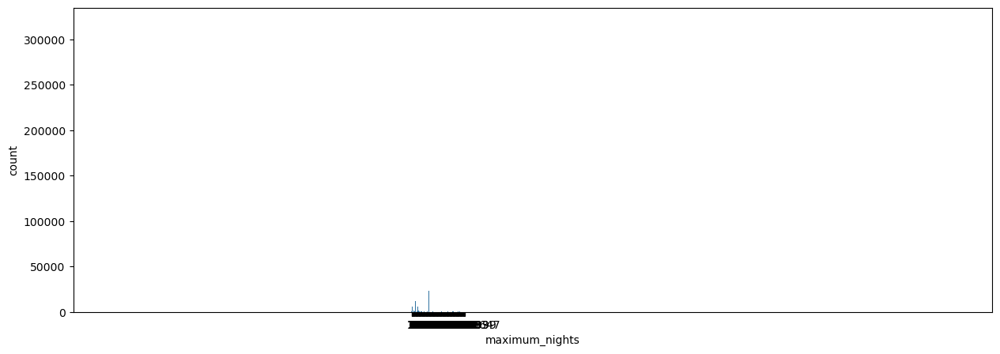

In [61]:
diagrama_caixa(base_airbnb['maximum_nights'])
grafico_barra(base_airbnb['maximum_nights'])

In [62]:
base_airbnb = base_airbnb.drop('maximum_nights', axis=1)
base_airbnb.shape

(581983, 21)

## number_of_reviews análise

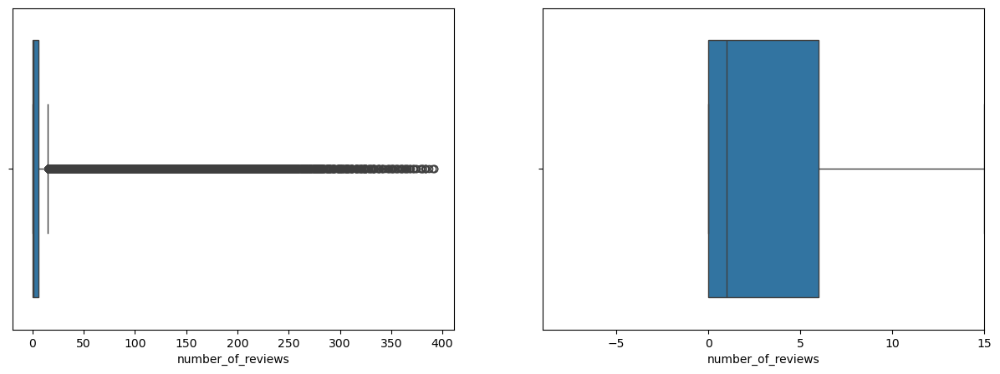

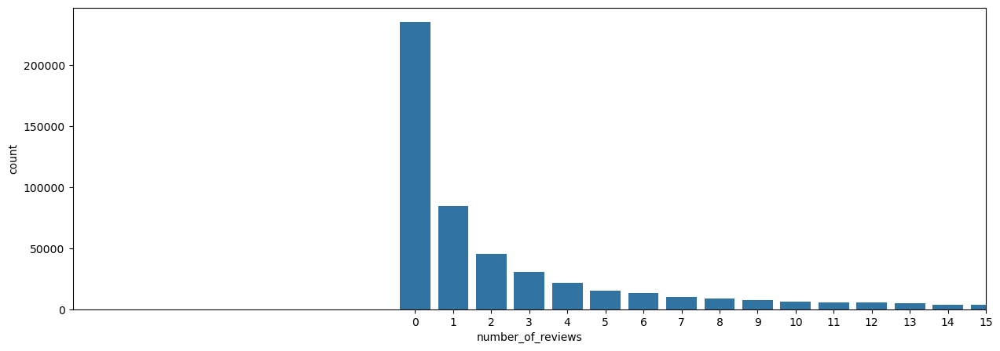

In [63]:
diagrama_caixa(base_airbnb['number_of_reviews'])
grafico_barra(base_airbnb['number_of_reviews'])

In [64]:
base_airbnb = base_airbnb.drop('number_of_reviews', axis=1)
base_airbnb.shape

(581983, 20)

# Tartamento de colunas valores texto

## property_type análise

In [65]:
print(base_airbnb['property_type'].value_counts())

property_type
Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                     

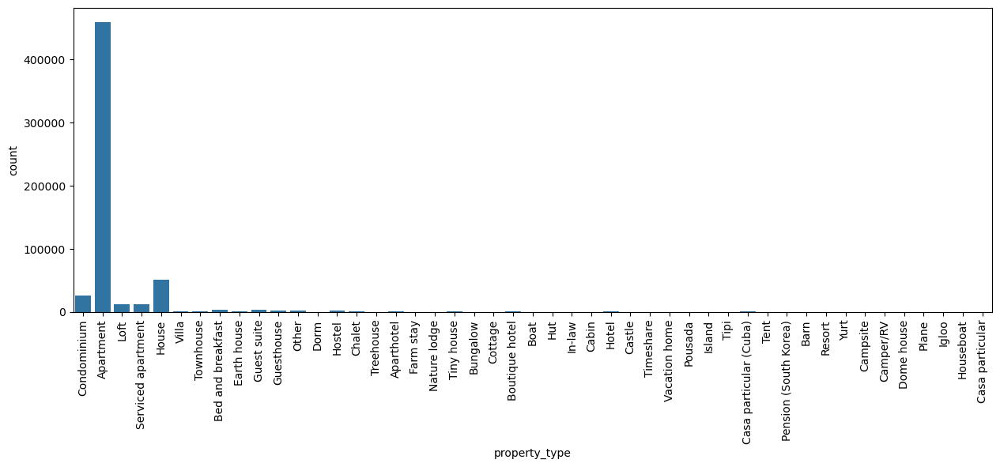

In [66]:
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='property_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)
plt.show()

In [67]:
# agrupando categorias de property_type
# Contar a frequência de cada valor na coluna
value_counts = base_airbnb['property_type'].value_counts()

# Substituir valores com frequência < 2000 por "Outros"
base_airbnb['property_type'] = base_airbnb['property_type'].apply(
    lambda x: x if value_counts[x] >= 2000 else 'Outros'
)

# Verificar o resultado
print(base_airbnb['property_type'].value_counts())

property_type
Apartment             458354
House                  51387
Condominium            26456
Serviced apartment     12671
Loft                   12352
Outros                  8850
Guest suite             3621
Bed and breakfast       3472
Hostel                  2665
Guesthouse              2155
Name: count, dtype: int64


### Room_type análise

room_type
Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: count, dtype: int64


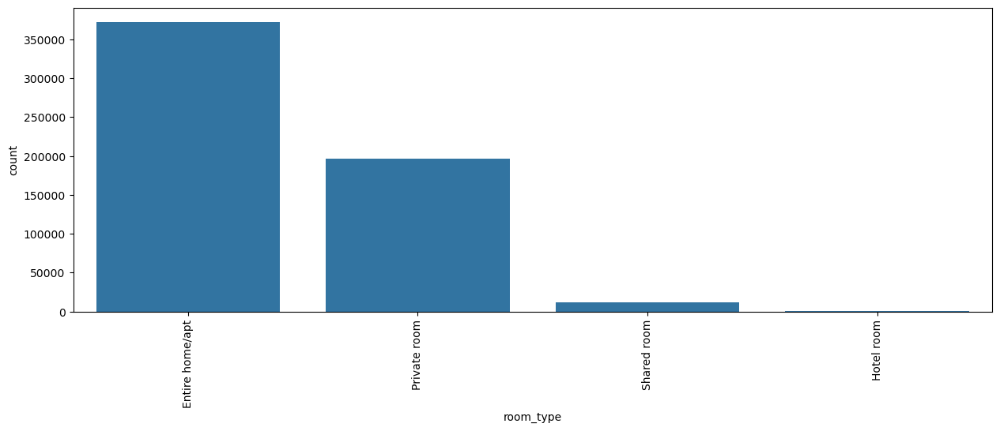

In [68]:
print(base_airbnb['room_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='room_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)
plt.show()

### bed_type análise

bed_type
Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: count, dtype: int64


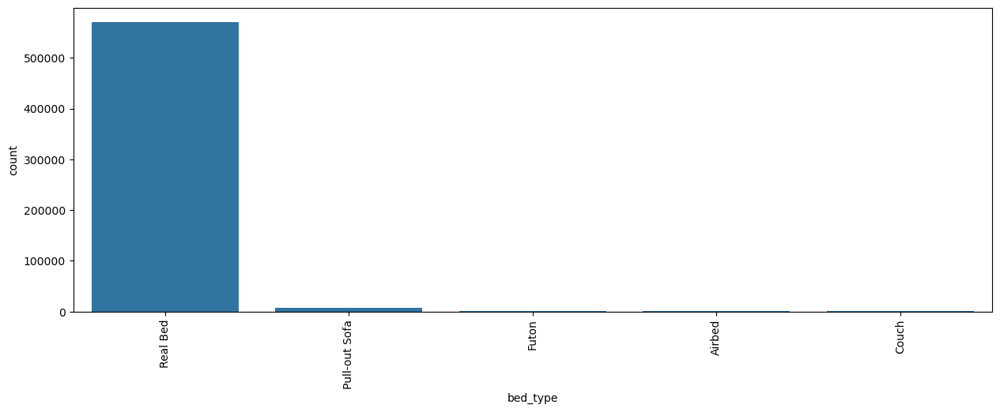

In [69]:
print(base_airbnb['bed_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='bed_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)
plt.show()

In [70]:
# agrupando categorias de cancellation_policy
# Contar a frequência de cada valor na coluna
value_counts = base_airbnb['bed_type'].value_counts()

# Substituir valores com frequência < 2000 por "Outros"
base_airbnb['bed_type'] = base_airbnb['bed_type'].apply(
    lambda x: x if value_counts[x] >= 10000 else 'Outros'
)

# Verificar o resultado
print(base_airbnb['bed_type'].value_counts())

bed_type
Real Bed    570643
Outros       11340
Name: count, dtype: int64


### cancellation_policy análise

cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: count, dtype: int64


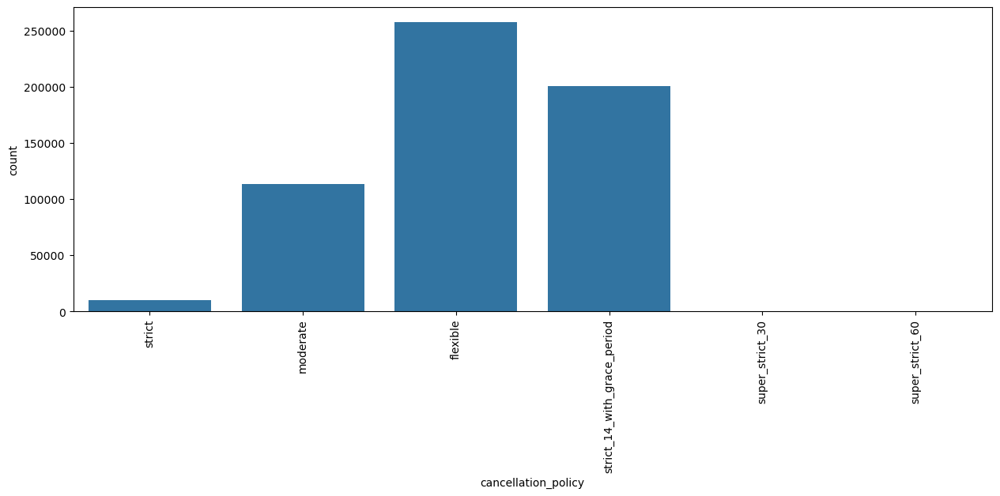

In [71]:
print(base_airbnb['cancellation_policy'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='cancellation_policy', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)
plt.show()

In [72]:
# agrupando categorias de cancellation_policy
# Contar a frequência de cada valor na coluna
value_counts = base_airbnb['cancellation_policy'].value_counts()

# Substituir valores com frequência < 2000 por "Outros"
base_airbnb['cancellation_policy'] = base_airbnb['cancellation_policy'].apply(
    lambda x: x if value_counts[x] >= 10000 else 'strict'
)

# Verificar o resultado
print(base_airbnb['cancellation_policy'].value_counts())

cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: count, dtype: int64


### Temos uma diversidade de amenities e foi identificado algumas amenities que são escritas de forma diferente porém se referem a mesma coisa. Sendo assim, vamos avaliar o número de amenities e não os seus itens em si.

In [73]:
print(base_airbnb['amenities'].iloc[0].split(','))
print(len(base_airbnb['amenities'].iloc[0].split(',')))

base_airbnb['n_amenities'] = base_airbnb['amenities'].str.split(',').apply(len)

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', '"Paid parking off premises"', '"Smoking allowed"', 'Doorman', 'Elevator', '"Hot tub"', '"Family/kid friendly"', '"Suitable for events"', 'Essentials', '"24-hour check-in"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"', '"Self check-in"', '"Front desk/doorperson"', '"Private entrance"', '"Hot water"', '"Bed linens"', '"Luggage dropoff allowed"}']
25


In [74]:
base_airbnb = base_airbnb.drop('amenities', axis=1)
base_airbnb.shape

(581983, 20)

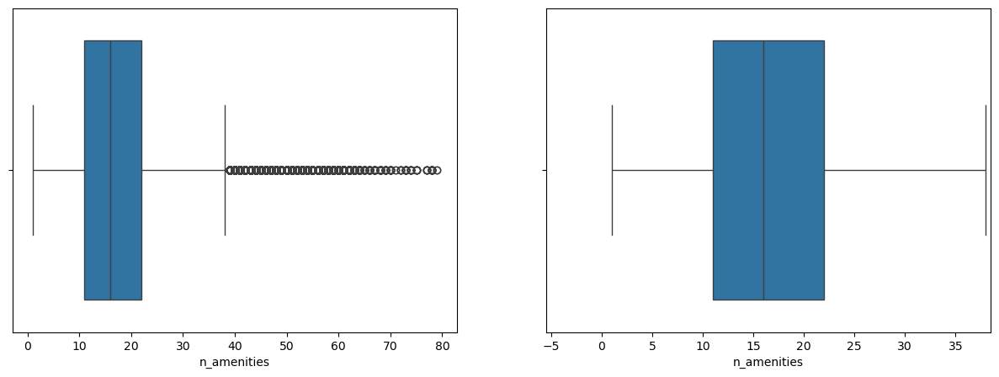

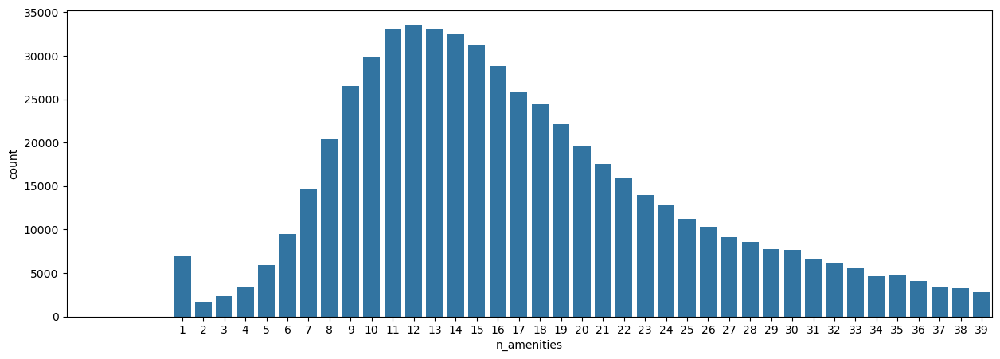

In [75]:
diagrama_caixa(base_airbnb['n_amenities'])
grafico_barra(base_airbnb['n_amenities'])

In [76]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'n_amenities')
print('{} linhas removidas'.format(linhas_removidas))

24343 linhas removidas


### Visualização de mapa das propriedades

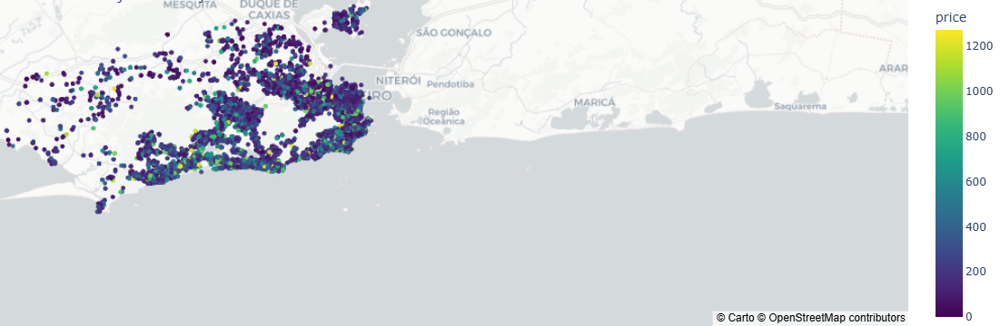

In [77]:
# Filtrando a amostragem de 50.000 linhas do DataFrame
amostra_base_airbnb = base_airbnb.sample(n=50000, random_state=42)

# Criando o gráfico de mapa interativo
fig = px.scatter_mapbox(
    amostra_base_airbnb, 
    lat="latitude", 
    lon="longitude", 
    color="price", 
    color_continuous_scale=px.colors.sequential.Viridis,  # Escala de cores
    size_max=15, 
    zoom=10, 
    title="Distribuição de Preços no Airbnb"
)

# Configurando o estilo do mapa (necessário para mapbox)
fig.update_layout(
    mapbox_style="carto-positron",  # Estilo do mapa
    margin={"r":0,"t":0,"l":0,"b":0}  # Margens ajustadas para melhor visualização
)

# Mostrando o gráfico
fig.show()

### Encoding
Vamos ajustar as features para permitir uma acertividade maior do modelo futuro.

    - Features com modelo True ou False, vamos subistituir por 1 e 0 respectivamente
    - Features de categoria (em que os valores são texto) vamos utilizar variáveis dummies.

In [81]:
# Criar uma cópia do DataFrame original
base_airbnb_cod = base_airbnb.copy()

# Lista de colunas a serem transformadas
colunas_tf = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready']

# Substituir os valores 't' por 1 e 'f' por 0 nas colunas especificadas
base_airbnb_cod[colunas_tf] = base_airbnb_cod[colunas_tf].replace({'t': 1, 'f': 0})

C:\Users\Luis Roberta\AppData\Local\Temp\ipykernel_9028\2964490330.py:8: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [84]:
# Exibir as primeiras linhas para verificar o resultado
print(base_airbnb_cod.iloc[1])

host_is_superhost                         0
host_listings_count                     3.0
latitude                         -22.977117
longitude                        -43.190454
property_type                     Apartment
room_type                   Entire home/apt
accommodates                              3
bathrooms                               1.0
bedrooms                                1.0
beds                                    2.0
bed_type                           Real Bed
price                                 161.0
extra_people                           45.0
minimum_nights                            4
instant_bookable                          0
is_business_travel_ready                  0
cancellation_policy                  strict
mes                                       4
ano                                    2018
n_amenities                              14
Name: 3, dtype: object


In [85]:
# Lista de colunas categóricas
colunas_categoria = ['property_type', 'room_type', 'bed_type', 'cancellation_policy']

# Criar dummies para as colunas categóricas e concatenar com o DataFrame
base_airbnb_cod = pd.get_dummies(data=base_airbnb_cod, columns=colunas_categoria)

# Exibir as primeiras linhas do DataFrame transformado
print(base_airbnb_cod.head())

   host_is_superhost  host_listings_count   latitude  longitude  accommodates  \
1                  1                  2.0 -22.965919 -43.178962             5   
3                  0                  3.0 -22.977117 -43.190454             3   
4                  1                  1.0 -22.983024 -43.214270             3   
5                  1                  1.0 -22.988165 -43.193588             3   
6                  1                  1.0 -22.981269 -43.190457             2   

   bathrooms  bedrooms  beds  price  extra_people  ...  \
1        1.0       2.0   2.0  270.0          51.0  ...   
3        1.0       1.0   2.0  161.0          45.0  ...   
4        1.0       1.0   2.0  222.0          68.0  ...   
5        1.5       1.0   2.0  308.0          86.0  ...   
6        1.0       1.0   2.0  219.0          80.0  ...   

   room_type_Entire home/apt  room_type_Hotel room  room_type_Private room  \
1                       True                 False                   False   
3       

In [86]:
print(base_airbnb_cod.iloc[0])

host_is_superhost                                          1
host_listings_count                                      2.0
latitude                                          -22.965919
longitude                                         -43.178962
accommodates                                               5
bathrooms                                                1.0
bedrooms                                                 2.0
beds                                                     2.0
price                                                  270.0
extra_people                                            51.0
minimum_nights                                             4
instant_bookable                                           1
is_business_travel_ready                                   0
mes                                                        4
ano                                                     2018
n_amenities                                               25
property_type_Apartment 

## Modelo de Previsão

- Métricas de analiação

In [105]:
def avaliar_modelo(nome_modelo, y_true, previsao):
    """
    Avalia o desempenho de um modelo calculando R² e RMSE.

    Parâmetros:
    - nome_modelo (str): Nome do modelo.
    - y_true (array-like): Valores reais do target.
    - y_pred (array-like): Valores previstos pelo modelo.

    Retorno:
    - str: Nome do modelo.
    - float: Valor de R².
    - float: Valor de RMSE.
    """
    # Calcular R²
    r2 = r2_score(y_true, previsao)
    
    # Calcular RMSE
    rmse = np.sqrt(mean_squared_error(y_true, previsao))
    
    # Retornar os resultados em linhas diferentes
    return f"Modelo: {nome_modelo}", f"R²: {r2:.2f}", f"RMSE: {rmse:.2f}"


- Escolhas dos modelos a serem avaliados
  1. Rendom Forest
  2. LinearRegression
  3. Extra Tree

In [91]:
modelo_rf = RandomForestRegressor()
modelo_lr = LinearRegression()
modelo_et = ExtraTreesRegressor()

modelos = {'LinearRegression': modelo_lr,
            'RandomForest': modelo_rf,
            'ExtraTrees': modelo_et}

y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis = 1)

- Separa dados de treino e teste + Treino do Modelo

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

for nome_modelo, modelo in modelos.items():
    #treinar
    modelo.fit(X_train, y_train)
    #testar
    previsao = modelo.predict(X_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

('Modelo: LinearRegression', 'R²: 0.3266', 'RMSE: 217.3438')
('Modelo: RandomForest', 'R²: 0.9706', 'RMSE: 45.3813')
('Modelo: ExtraTrees', 'R²: 0.9728', 'RMSE: 43.6588')


- Modelo escolhido foi o ExtraTreesRegressor
  Esso modelo teve o maios R² e o menor RMSE. Não houve grande diferença de tempo entre o treino e teste desse modelo em relação ao RandomForestRegressor, optamos pelo Extra Tree.
  Resultado de avaliação do Extra Tree:<br>
  R²: 0.9728<br>
  RMSE: 43.6588

### Ajustes e Melhorias no modelo

In [95]:
# Importâncias das features
importancias = modelo_et.feature_importances_

# Nomes das colunas
nomes_colunas = X_train.columns

# Criar um DataFrame para combinar os dados
df_importancias = pd.DataFrame({
    'Feature': nomes_colunas,
    'Importance': importancias
})

# Ordenar as importâncias em ordem decrescente
df_importancias = df_importancias.sort_values(by='Importance', ascending=False)

# Exibir o DataFrame
print(df_importancias)


                                            Feature  Importance
6                                          bedrooms    0.116043
2                                          latitude    0.103430
3                                         longitude    0.100594
14                                      n_amenities    0.089449
8                                      extra_people    0.086992
4                                      accommodates    0.071066
25                        room_type_Entire home/apt    0.068148
5                                         bathrooms    0.066683
9                                    minimum_nights    0.065350
7                                              beds    0.052691
1                               host_listings_count    0.039669
10                                 instant_bookable    0.022076
31                     cancellation_policy_flexible    0.019295
0                                 host_is_superhost    0.013704
15                          property_typ

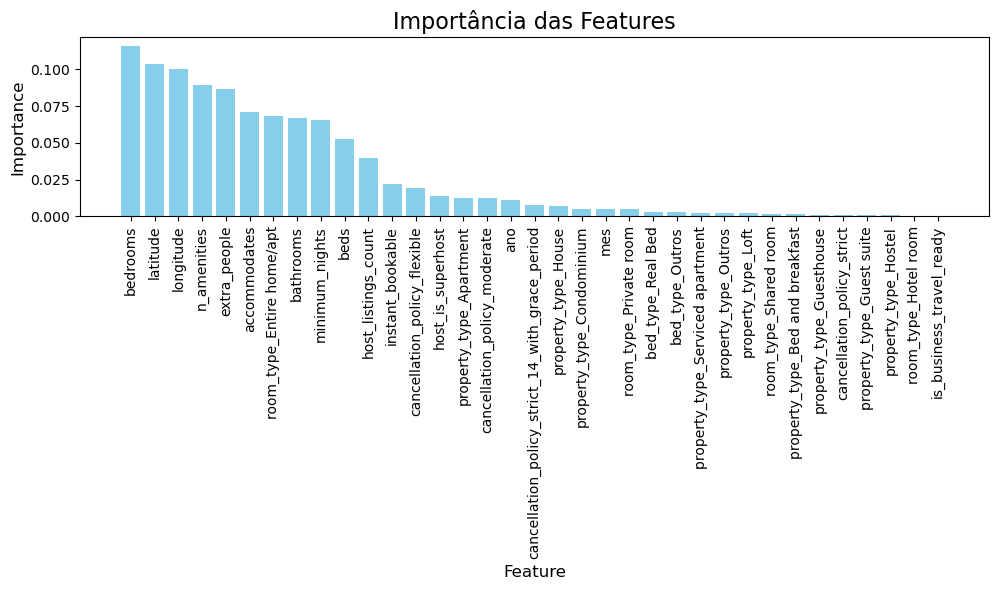

In [96]:
# Criar o gráfico de barras
plt.figure(figsize=(10, 6))  # Tamanho do gráfico
plt.bar(df_importancias['Feature'], df_importancias['Importance'], color='skyblue')

# Adicionar títulos e rótulos
plt.title('Importância das Features', fontsize=16)
plt.xlabel('Feature', fontsize=12)
plt.ylabel('Importance', fontsize=12)

# Rotacionar os rótulos do eixo X
plt.xticks(rotation=90, fontsize=10)

# Exibir o gráfico
plt.tight_layout()  # Ajusta o layout para evitar cortes nos rótulos
plt.show()

### Ajustes finais do modelo
- Foi idenditifaco que feature is_business_travel_ready não parece ter impacto no modelo, então na intensão de simplifica-lo, vamos revover essa feature.

In [112]:
# Remover a coluna somente se ela existir no DataFrame
if 'is_business_travel_ready' in base_airbnb_cod.columns:
    base_airbnb_cod = base_airbnb_cod.drop('is_business_travel_ready', axis=1)

# Continuar com o restante do código
y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Treinar o modelo
modelo_et.fit(X_train, y_train)

# Ordenar e remover 'is_business_travel_ready' se necessário
df_importancias = df_importancias.sort_values(by='Importance', ascending=False)

if 'is_business_travel_ready' in df_importancias['Feature'].values:
    df_importancias = df_importancias[df_importancias['Feature'] != 'is_business_travel_ready']
    df_importancias = df_importancias.reset_index(drop=True)
    
# Testar o modelo
previsao = modelo_et.predict(X_test)
print(avaliar_modelo("Modelo ET", y_test, previsao))


('Modelo: Modelo ET', 'R²: 0.97', 'RMSE: 43.73')


In [113]:
base_teste = base_airbnb_cod.copy()
# Remover a coluna somente se ela existir no DataFrame
for coluna in base_teste:
    if 'bed_type' in coluna:
        base_teste = base_teste.drop(coluna, axis=1)
print(base_teste)
# Continuar com o restante do código
y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Treinar o modelo
modelo_et.fit(X_train, y_train)
    
# Testar o modelo
previsao = modelo_et.predict(X_test)
print(avaliar_modelo("Modelo ET", y_test, previsao))

        host_is_superhost  host_listings_count   latitude  longitude  \
1                       1                  2.0 -22.965919 -43.178962   
3                       0                  3.0 -22.977117 -43.190454   
4                       1                  1.0 -22.983024 -43.214270   
5                       1                  1.0 -22.988165 -43.193588   
6                       1                  1.0 -22.981269 -43.190457   
...                   ...                  ...        ...        ...   
902204                  0                  1.0 -22.986030 -43.191660   
902205                  0                  0.0 -23.003180 -43.342840   
902206                  0                  0.0 -22.966640 -43.393450   
902208                  0                  0.0 -23.003400 -43.341820   
902209                  0                  5.0 -23.010560 -43.363350   

        accommodates  bathrooms  bedrooms  beds  price  extra_people  ...  \
1                  5        1.0       2.0   2.0  270.0    

### Deploy do projeto

In [114]:
X['price'] = y
X.to_csv('dados.csv')

In [115]:
import joblib
joblib.dump(modelo_et, 'modelo.joblib')

['modelo.joblib']